# Vehicle inspection
Mainly used in depth learning and digital image processing technology to detect, extract and recognize characters

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from os.path import splitext, basename
from keras.models import model_from_json
import pytesseract
import glob

## Load pre-training model

In [2]:
def load_model(path):
    path = splitext(path)[0]
    
    with open(f'{path}.json', 'r') as json_file:
        model_json = json_file.read()
        
    model = model_from_json(model_json, custom_objects={})
    model.load_weights(f'{path}.h5')
    
    return model

wpod_net_path = "/kaggle/input/d/shashwatsarkar/wpod-net/wpod-net.json"
wpod_net = load_model(wpod_net_path)

## Pre-processing
Including picture normalization and scaling, etc.。

In [3]:
def preprocess_image(image_path, size=None):
    img = cv2.imread(image_path)
    # cv2 defaults to the BGR channel, but the model training is an RGB channel, and the output picture of the commonly used plt library is also rgb, so it is best to convert it.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Normalization
    img = img / 255
    if size is not None:
        img = cv2.resize(img, size)
    return img

## Load dataset

The function can randomly produce different pictures by changing the seed parameter, and change the limit parameter to read more pictures.

Found 433 images...


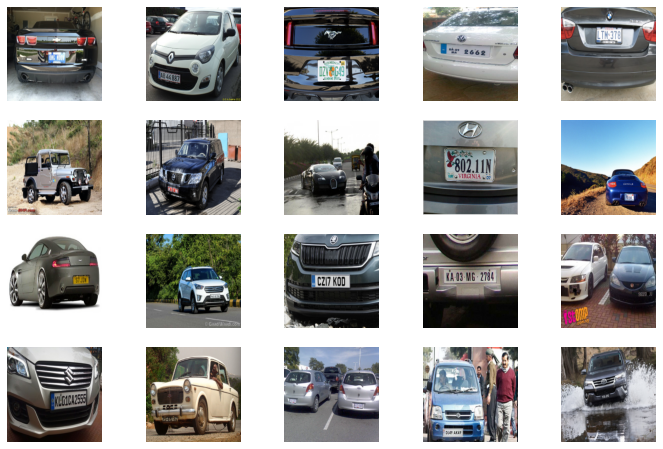

In [4]:
def load_images(limit = None, seed = 0, load=False):
    # First folder all the pictures
    image_paths = glob.glob("../input/car-plate-detection/images/*")
    image_count =  len(image_paths)
    print(f'Found {image_count} images...')

    # Shuffle the cards and draw the specified number
    if limit is None or limit > image_count:
        limit = image_count
    if limit < 0:
        return
    np.random.seed(seed)
    image_paths = np.random.choice(image_paths, limit, replace=False)
    
    imgs = []
    if load is True:
        for image_path in image_paths:
            img = preprocess_image(image_path, size=(224, 224))
            imgs.append(img)

    return image_paths, imgs
        
def show_images(imgs, titles=None, grid=(4, 5), figsize=(12, 8)):
    fig = plt.figure(figsize=figsize)

    for i in range(grid[0]*grid[1]):
        if i >= len(imgs):
            return
    
        fig.add_subplot(grid[0], grid[1], i+1)
        plt.axis(False)
        if titles is not None and i < len(titles):
            plt.title(titles[i])
        try:
            if (len(imgs[i].shape) == 2):
                plt.imshow(imgs[i], cmap="gray")    
            else:
                plt.imshow(imgs[i])
        except:
            plt.text(0.5, 0.5, 'Missed', **dict(ha='center', va='center', fontsize=16, color='C1'))
            pass

image_paths, loaded_images = load_images(limit=20, seed=0, load=True)
show_images(loaded_images)


## Explain the model results
The following set of functions is used to explain the results of the model, [From the author's warehouse]**(https://github.com/sergiomsilva/alpr-unconstrained/blob/1cf77f16d84d5f6e407cd15afd6bdd76ad4deca4/src/keras_utils.py) My job is just adding comments**

In order to add optimization steps, the results of the WPOD-NET model are not expressed as the coordinates of the corner points of the license plate, but some pre-specified parameters.

A complete set of parameters is divided into 8 dimensions：
* The first 2 dimensions indicate the probability that the point is the center of the license plate
*The last 6 dimensions carry the relevant parameters of the affine transformation of the license plate (can be used to generate the affine transformation matrix, not the matrix itself)

The result is composed of multiple sets of such parameters

The interpretation code itself is confusing. Some operations are specified for error calculation (gradient descent) during model training; here, in order to interpret the results, the process needs to be matched.

For specific reasons and how to stipulate, please refer to [original paper](https://openaccess.thecvf.com/content_ECCV_2018/papers/Sergio_Silva_License_Plate_Detection_ECCV_2018_paper.pdf)
(You can focus on the principle and error function parts).

In [5]:
class Label:
    def __init__(self, cl=-1, tl=np.array([0., 0.]), br=np.array([0., 0.]), prob=None):
        self.__tl = tl
        self.__br = br
        self.__cl = cl
        self.__prob = prob

    def __str__(self):
        return 'Class: %d, top left(x: %f, y: %f), bottom right(x: %f, y: %f)' % (
        self.__cl, self.__tl[0], self.__tl[1], self.__br[0], self.__br[1])

    def copy(self):
        return Label(self.__cl, self.__tl, self.__br)

    def wh(self): return self.__br - self.__tl

    def cc(self): return self.__tl + self.wh() / 2

    def tl(self): return self.__tl

    def br(self): return self.__br

    def tr(self): return np.array([self.__br[0], self.__tl[1]])

    def bl(self): return np.array([self.__tl[0], self.__br[1]])

    def cl(self): return self.__cl

    def area(self): return np.prod(self.wh())

    def prob(self): return self.__prob

    def set_class(self, cl):
        self.__cl = cl

    def set_tl(self, tl):
        self.__tl = tl

    def set_br(self, br):
        self.__br = br

    def set_wh(self, wh):
        cc = self.cc()
        self.__tl = cc - .5 * wh
        self.__br = cc + .5 * wh

    def set_prob(self, prob):
        self.__prob = prob

class DLabel(Label):
    def __init__(self, cl, pts, prob):
        self.pts = pts
        tl = np.amin(pts, axis=1)
        br = np.amax(pts, axis=1)
        Label.__init__(self, cl, tl, br, prob)

def getWH(shape):
    return np.array(shape[1::-1]).astype(float)

def IOU(tl1, br1, tl2, br2):
    wh1, wh2 = br1-tl1, br2-tl2
    assert((wh1 >= 0).all() and (wh2 >= 0).all())
    
    intersection_wh = np.maximum(np.minimum(br1, br2) - np.maximum(tl1, tl2), 0)
    intersection_area = np.prod(intersection_wh)
    area1, area2 = (np.prod(wh1), np.prod(wh2))
    union_area = area1 + area2 - intersection_area
    return intersection_area/union_area

def IOU_labels(l1, l2):
    """
    Calculate the overlap between license plates
    """
    return IOU(l1.tl(), l1.br(), l2.tl(), l2.br())

def nms(Labels, iou_threshold=0.5):
    """
    Use the Non-maximum Suppression algorithm to filter out non-duplicate license plates
    """
    SelectedLabels = []
    Labels.sort(key=lambda l: l.prob(), reverse=True)
    
    for label in Labels:
        non_overlap = True
        for sel_label in SelectedLabels:
            if IOU_labels(label, sel_label) > iou_threshold:
                non_overlap = False
                break

        if non_overlap:
            SelectedLabels.append(label)
    return SelectedLabels

def find_T_matrix(pts, t_pts):
    A = np.zeros((8, 9))
    for i in range(0, 4):
        xi = pts[:, i]
        xil = t_pts[:, i]
        xi = xi.T
        
        A[i*2, 3:6] = -xil[2]*xi
        A[i*2, 6:] = xil[1]*xi
        A[i*2+1, :3] = xil[2]*xi
        A[i*2+1, 6:] = -xil[0]*xi

    [U, S, V] = np.linalg.svd(A)
    H = V[-1, :].reshape((3, 3))
    return H

def getRectPts(tlx, tly, brx, bry):
    return np.matrix([[tlx, brx, brx, tlx], [tly, tly, bry, bry], [1, 1, 1, 1]], dtype=float)

def normal(pts, side, mn, MN):
    pts_MN_center_mn = pts * side
    pts_MN = pts_MN_center_mn + mn.reshape((2, 1))
    pts_prop = pts_MN / MN.reshape((2, 1))
    return pts_prop

# Reconstruction function from predict value into plate crpoped from image
def reconstruct(I, Iresized, Yr, lp_threshold):
    # Since the picture will shrink after training, it is estimated that the original image will shrink during training, so that the original image can be re-adapted to the pixel space after training.
    net_stride = 2**4
    #Side is the “side length” of each unit about the original image when the output image features are stretched to the same size as the original image.
    # 208 and 40 are the maximum input and minimum input during the training of the model.If you change the data set training, you should change the value to get the best estimate.
    side = ((208 + 40)/2)/net_stride

    # One-line or two-line license plate
    one_line = (470, 110)
    two_lines = (280, 200)

    # The first two-dimensional parameters of the model represent whether the location is indeed the center of a license plate (expressed in probability)
    Probs = Yr[..., 0]
    # The last 6 dimensions are the parameters of the affine transformation, which are used to restore the license plate from the distorted coordinate space to cartesian coordinates
    Affines = Yr[..., 2:]

    # Find all the plates in coordinates(m, n)
    xx, yy = np.where(Probs > lp_threshold)

    # Get the image size from the actual training input
    WH = getWH(Iresized.shape)
    # Actual output image size
    MN = WH/net_stride

    # ==================================================================
    # The whole process below is to restore the license plate twisted into a parallelogram to a rectangle
    # The idea of affine transformation is mainly used, and its parameters are directly obtained by model training
    # Some of the more confusing statements are actually determined by the loss function
    # The loss function determines the training mode of the model, and now in the testing and reconstruction stages, this mode needs to be followed in order to output correctly. All operations are meaningful and cannot be saved.
    # The operation in question can be understood in conjunction with the original paper
    # ==================================================================
    vxx = vyy = 0.5
    # Represents the range of the corner points of the prediction result in the undistorted (a cartesian coordinate that does not actually exist in the image space).
    base = lambda vx, vy: np.matrix([[-vx, -vy, 1], [vx, -vy, 1], [vx, vy, 1], [-vx, vy, 1]]).T
    labels = []
    labels_frontal = []

    # For the center of each license plate, the affine transformation parameters obtained by training are used to restore the position of the license plate in cartesian coordinates.
    for i in range(len(xx)):
        x, y = xx[i], yy[i]
        affine = Affines[x, y]
        prob = Probs[x, y]

        mn = np.array([float(y) + 0.5, float(x) + 0.5])

        # The parameters for estimating the position of the license plate are generated by parameter group A, which is directly specified during model training.
        A = np.reshape(affine, (2, 3))
        A[0, 0] = max(A[0, 0], 0)
        A[1, 1] = max(A[1, 1], 0)
        
        # The parameters for estimating the corrected position of the license plate are generated by the following parameter group B.
        # This form is also directly specified during model training.
        B = np.zeros((2, 3))
        B[0, 0] = max(A[0, 0], 0)
        B[1, 1] = max(A[1, 1], 0)
        
        # Restore the corner coordinates (but not in the original image coordinate system), this operation should also be specified during model training
        pts = np.array(A*base(vxx, vyy))
        # Restore the corrected position of the license plate (but it should not be in the original image coordinate system), this operation should also be specified during model training
        pts_frontal = np.array(B*base(vxx, vyy))

        # Normalize the above coordinates
        pts_prop = normal(pts, side, mn, MN)
        frontal = normal(pts_frontal, side, mn, MN)

        labels.append(DLabel(0, pts_prop, prob))
        labels_frontal.append(DLabel(0, frontal, prob))
        
    # Filter the best from overlapping detection boxes
    final_labels = nms(labels, 0.1)
    final_labels_frontal = nms(labels_frontal, 0.1)

    #print(final_labels_frontal)
    assert final_labels_frontal, "No License plate is founded!"

    # Estimate one line or two lines from the aspect ratio (only affects the final perception)
    out_size, lp_type = (two_lines, 2) if ((final_labels_frontal[0].wh()[0] / final_labels_frontal[0].wh()[1]) < 1.7) else (one_line, 1)

    TLp = []
    Cor = []
    if len(final_labels):
        final_labels.sort(key=lambda x: x.prob(), reverse=True)
        for _, label in enumerate(final_labels):
            # output size
            t_ptsh = getRectPts(0, 0, out_size[0], out_size[1])
            # Apply the normalized coordinates to the original coordinates
            ptsh = np.concatenate((label.pts * getWH(I.shape).reshape((2, 1)), np.ones((1, 4))))
            # Generate a transformation matrix that cv2 can recognize
            H = find_T_matrix(ptsh, t_ptsh)
            # Extract the restored license plate picture from the original picture
            Ilp = cv2.warpPerspective(I, H, out_size, borderValue=0)
            
            TLp.append(Ilp)
            Cor.append(ptsh)
            
    return final_labels, TLp, lp_type, Cor

def detect_lp(model, I, max_dim, lp_threshold):
    # ======================================================
    # Undertake max_dim to continue to complete the size adjustment
    # The adjustment here is also only for the picture that the input is cropped to the vehicle
    # If the input is a complete picture, the effect is unknown
    # ======================================================
    min_dim_img = min(I.shape[:2])
    factor = float(max_dim) / min_dim_img
    w, h = (np.array(I.shape[1::-1], dtype=float) * factor).astype(int).tolist()
    Iresized = cv2.resize(I, (w, h))
    T = Iresized.copy()
    # prediction
    T = T.reshape((1, T.shape[0], T.shape[1], T.shape[2]))
    Yr = model.predict(T)
    Yr = np.squeeze(Yr)
    
    # Reconstruct the position of the license plate and the front view from the model results
    L, TLp, lp_type, Cor = reconstruct(I, Iresized, Yr, lp_threshold)
    return L, TLp, lp_type, Cor

## Extract license plate

In [6]:
def get_plate(image_path, Dmax=608, Dmin=256):
    # ======================================================
    # If you enter some pictures cropped to the vehicle, these scaling processes can make the detection of the side license plate more effective.
    # If the input is the original picture with background, these processes will also be carried out, but it is meaningless (the result may get better or worse)
    # ======================================================
    vehicle = preprocess_image(image_path)
    ratio = float(max(vehicle.shape[:2])) / min(vehicle.shape[:2])
    side = int(ratio * Dmin)
    bound_dim = min(side, Dmax)
    
    _ , LpImg, _, cor = detect_lp(wpod_net, vehicle, bound_dim, lp_threshold=0.5)
    
    return LpImg, cor

### Output license plate picture

Detect 1 plate(s) in Cars432


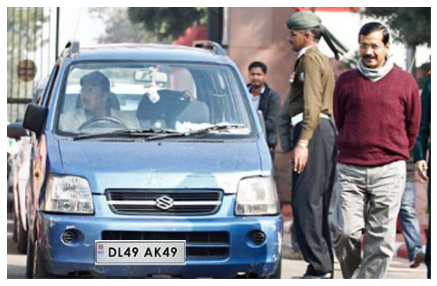

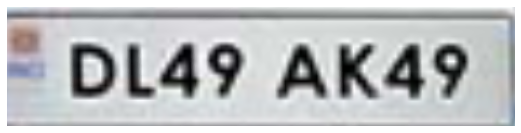

In [7]:
test_image = image_paths[18]
LpImg, cor = get_plate(test_image)
print("Detect %i plate(s) in"%len(LpImg), splitext(basename(test_image))[0])

plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.axis(False)
plt.imshow(preprocess_image(test_image))

show_images(LpImg, grid=(1,2), figsize=(20,5))

###  Mark the license plate

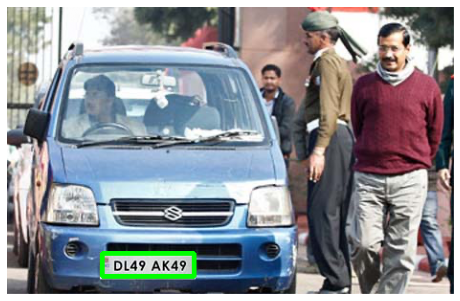

In [8]:
def get_boxs(cor):
    pts=[]  
    x_coordinates=cor[0]
    y_coordinates=cor[1]
    # Corner storage order: upper left, upper right, lower left, lower right
    for i in range(4):
        pts.append([int(x_coordinates[i]),int(y_coordinates[i])])
    
    pts = np.array(pts, np.int32)
    return pts.reshape((-1,1,2))

def draw_boxs(image_path, cors, thickness=3): 
    pts=[] 
    
    for cor in cors:
        pts.append(get_boxs(cor))
    vehicle_image = preprocess_image(image_path)
    
    cv2.polylines(vehicle_image, pts,True,(0,255,0),thickness)
    return vehicle_image

plt.figure(figsize=(8,8))
plt.axis(False)
plt.imshow(draw_boxs(test_image, cor))

## Result processing

### Image processing

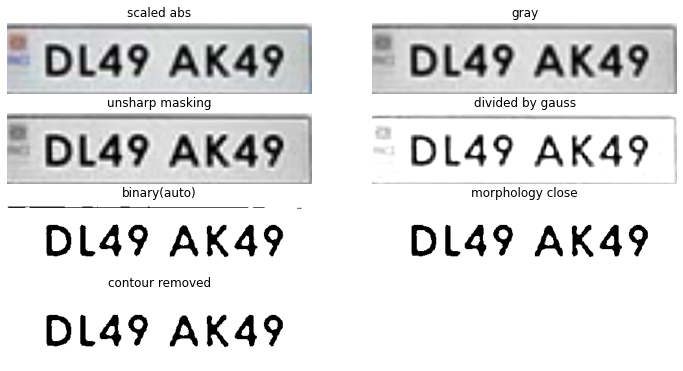

In [9]:
def remove_contour(src):
    cnts = cv2.findContours(src, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    
    mask = np.zeros(src.shape, dtype=np.uint8)
    cv2.fillPoly(mask, cnts, [255,255,255])
    mask = 255 - mask
    return cv2.bitwise_or(src, mask)
    
    
def sharpen(src):
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    return cv2.filter2d(src=src, ddepth=-1, kernel=kernel)

def unsharp_masking(src):
    gauss1 = cv2.GaussianBlur(src, (0,0), 2.0)
    return cv2.addWeighted(src, 1.5, gauss1, -0.5, 0.0)
    
def morphology_close(src):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    return cv2.morphologyEx(src, cv2.MORPH_CLOSE, kernel)

def divide_by_gauss(src):
    gauss2 = cv2.GaussianBlur(src, (0,0), 10.0)
    return cv2.divide(src, gauss2, scale=255)
    
def enhance_contrast(src):
    return cv2.equalizeHist(src)

def binary(src, thresh = -1):
    if thresh > 0:
        return cv2.threshold(src, thresh, 255, cv2.THRESH_BINARY)[1]
    else:
        (thresh, image_bin) = cv2.threshold(src, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
        return image_bin
    

def filter_images(images, debug=False):
    images_with_title = []
    image_src = images[0]
    
    image_bag = []
    title_bag = []
    image_bag.append(cv2.convertScaleAbs(image_src, alpha=(255.0)))
    title_bag.append("scaled abs")
    # gray
    image_bag.append(cv2.cvtColor(image_bag[-1], cv2.COLOR_BGR2GRAY))
    title_bag.append("gray")
    
    # unsharp mask
    image_bag.append(unsharp_masking(image_bag[-1]))
    title_bag.append("unsharp masking")
    
    # divided by gauss
    image_bag.append(divide_by_gauss(image_bag[-1]))
    title_bag.append("divided by gauss")
    
    # binary
    image_bag.append(binary(image_bag[-1]))
    title_bag.append("binary(auto)")
    
    # apply morphology
    image_bag.append(morphology_close(image_bag[-1]))
    title_bag.append("morphology close")

    # remove contour
    image_bag.append(remove_contour(image_bag[-1]))
    title_bag.append("contour removed")

    # or... crop
#     image_bag.append(image_bag[-1].copy())
#     title_bag.append("cropped")
#     image_bag[-1][0:25]=255
#     image_bag[-1][image_bag[-1].shape[0]-32:image_bag[-1].shape[0]]=255
#     image_bag[-1][:,0:55]=255
#     image_bag[-1][:,image_bag[-1].shape[1]-10:image_bag[-1].shape[1]]=255
    

    
    if debug:
        show_images(image_bag, title_bag, grid=(5,2))
        
    return image_bag
    
filtered_images = filter_images(LpImg, debug=True)

### Text recognition

DL49 AK49



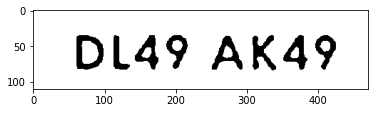

In [10]:
# You need to make sure that the black characters are on white background, otherwise the result is very general
# plt.imshow(img_dilation)
# Mask =cv2.bitwise_not(thre_mor)
Mask = filtered_images[-1]
plt.imshow(Mask,cmap="gray")
print(pytesseract.image_to_string(Mask, config="--psm 7"))


## Batch Testing


### License plate detection

Found 433 images...
13 in 60 missed


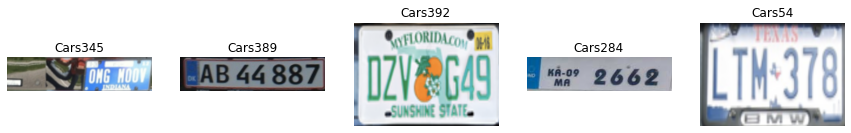

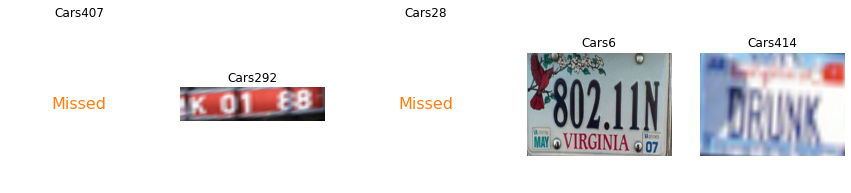

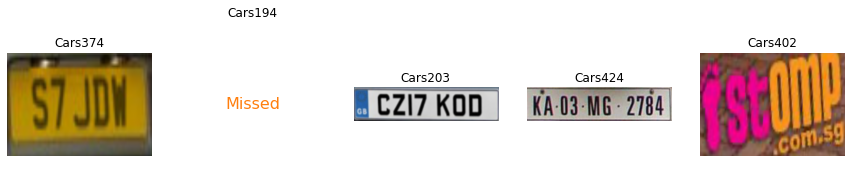

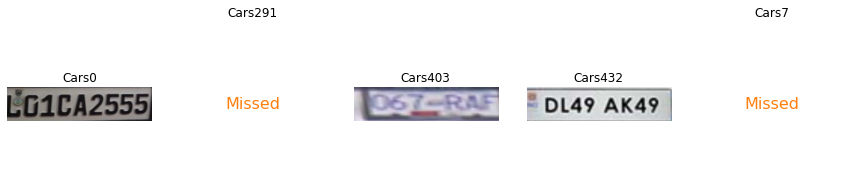

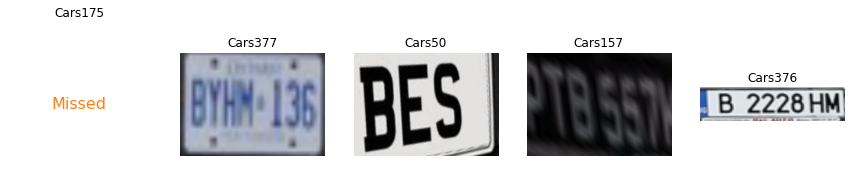

...

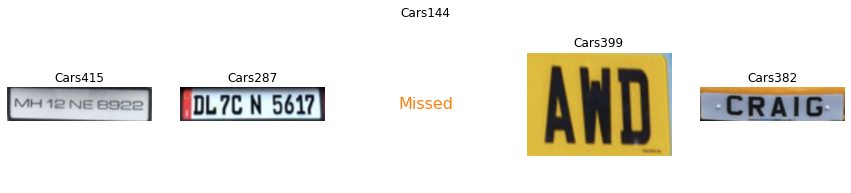

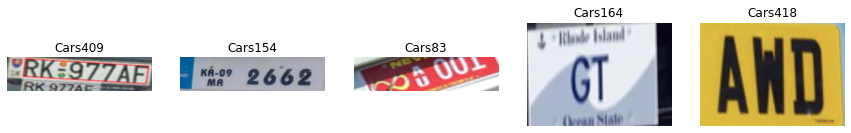

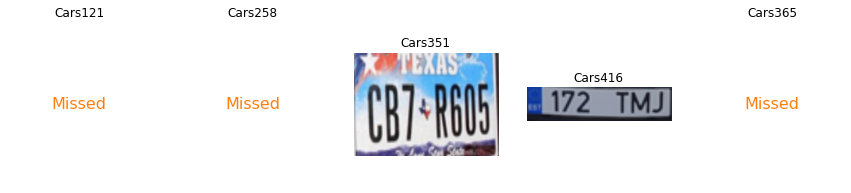

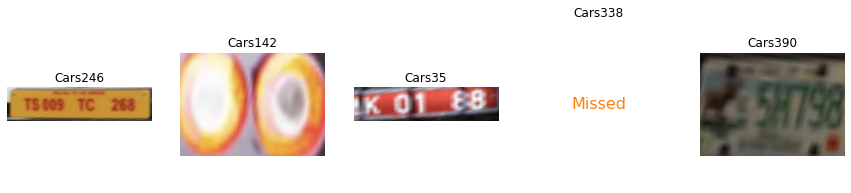

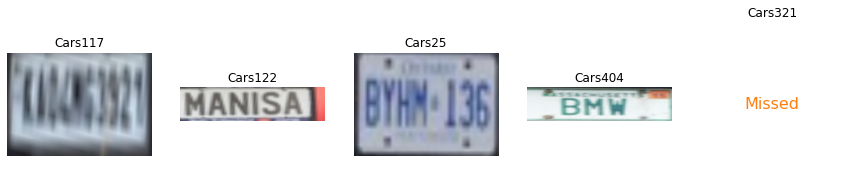

In [11]:

test_num = 60
image_paths, loaded_images = load_images(limit=test_num, seed=0)
images = []
titles = []
missed = 0
for i in range(test_num):   
    image_path = image_paths[i]
    try:
        LpImg, _ = get_plate(image_path)
    except:
        missed += 1
        images.append(None)
    else:
        images.append(LpImg[0])
    titles.append(splitext(basename(image_path))[0])
    
col = 5
print(f'{missed} in {test_num} missed')
for i in range(int((test_num-1)/col+1)):
    i=i*col
    show_images(images[i:i+col:], titles[i:i+col:], grid=(1,5), figsize=(15,3))

### Complete schematic
Since all image processing uses automatic parameters, the processing results are relatively random.

Found 433 images...


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


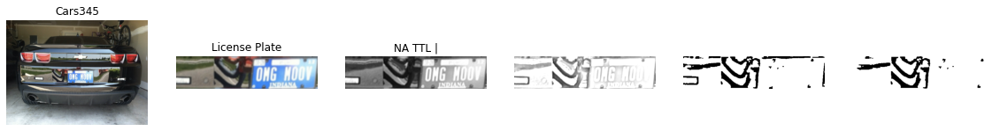

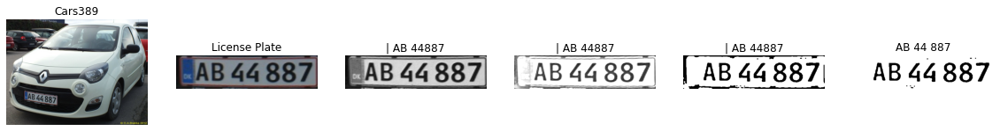

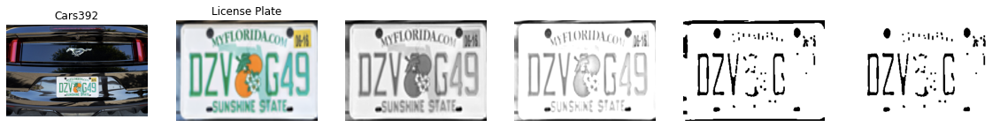

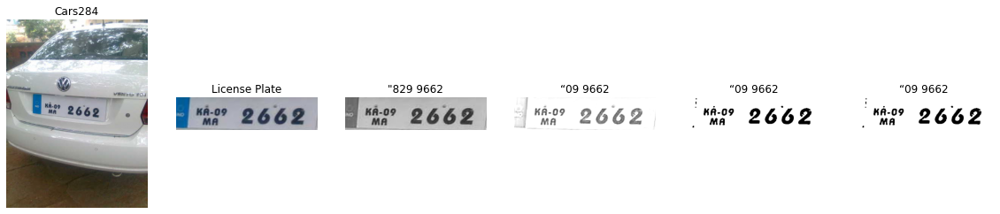

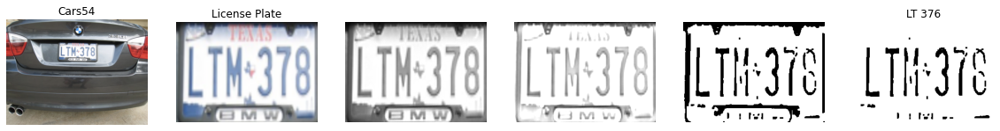

...

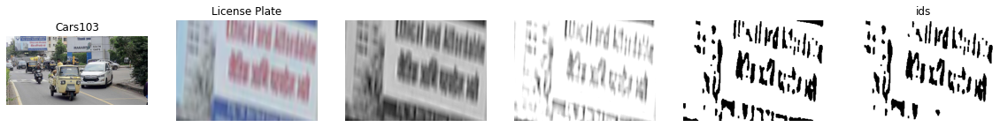

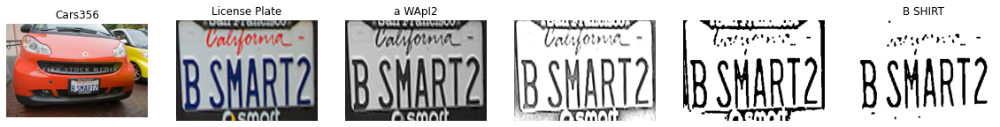

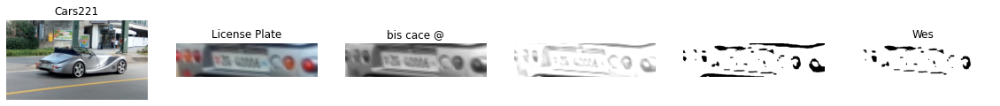

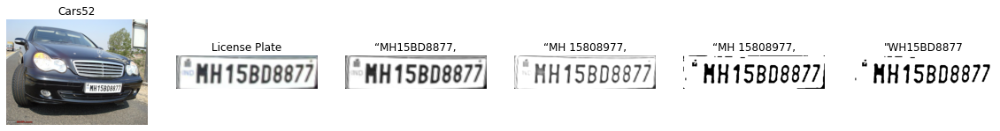

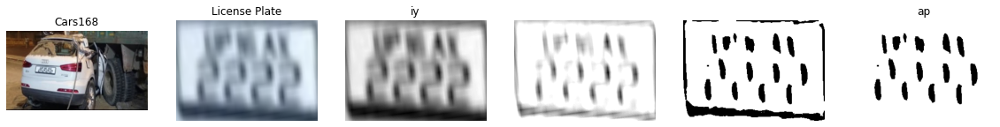

In [12]:
def one_item(image_path):
    def s(img):
        a = pytesseract.image_to_string(img, config='--psm 7')[:-1].strip()
        return a
    try:
        LpImg, _ = get_plate(image_path)
    except:
        show_images([preprocess_image(image_path)],[splitext(basename(image_path))[0] + ' failed'], grid=(1,6), figsize=(20,6))
        return
    imgs = filter_images(LpImg)
    
    show_images([preprocess_image(image_path), LpImg[0], imgs[2], imgs[3], imgs[-2], imgs[-1]],
                [splitext(basename(image_path))[0], "License Plate", s(imgs[3]),s(imgs[5]),s(imgs[-2]),s(imgs[-1])], grid=(1,6), figsize=(20,6))

test_num = 100
image_paths, loaded_images = load_images(limit=test_num, seed=0)
for i in range(test_num):   
    one_item(image_paths[i])

## TODOs
*Single text extraction